<a href="https://colab.research.google.com/github/Nikhil5566/EDA-Repo/blob/main/The_Most_Popular_Books_for_Exchanging.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# The most popular book exchanging

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

# About the Dataset and Insights

### Data Analysis Key Findings

*   The dataset contains 990 entries and 18 columns, primarily focusing on popular English-language books.
*   **Missing Data**: Significant missing values were observed in `awards` (606 missing, ~61\%) and `movie_release_year` (348 missing, ~35\%).
*   **Data Anomalies**: A notable outlier in `publicationYear` is -750, indicating a potential data entry error, though most books were published in the 20th and 21st centuries.
*   **Numerical Distributions**:
    *   `pageCount` is right-skewed, with most books having between 250 and 450 pages.
    *   `rating_average` is generally high, concentrated between 3.9 and 4.2, suggesting a curated list of well-received books.
    *   `movie_release_year` for adapted books peaks around 2005-2015.
*   **Categorical Dominance**:
    *   `language`: English overwhelmingly dominates (957 out of 990 books).
    *   `genre`: 'Fantasy' (155 entries) and 'Children's Fiction' (144 entries) are the most frequent.
    *   `author`: Stephen King is the most prolific with 26 books.
    *   `most_popular_country`: The USA accounts for 588 books.
    *   `age_category`: 'Adult' books constitute the largest segment (778 entries).
*   **Popularity Bias**: The dataset is heavily biased towards bestsellers (986 out of 990 books) and books adapted into movies (644 out of 990 books).
*   **Bivariate Relationships**:
    *   A strong positive correlation (approximately 0.75) exists between `publicationYear` and `movie_release_year`, indicating newer books tend to have more recent movie adaptations.
    *   There is no significant correlation between `pageCount` and `rating_average`, meaning book length does not consistently influence its average rating.
    *   'Children's' books tend to have slightly higher average ratings compared to 'Adult' or 'Young Adult' categories.
    *   Movie adaptation status does not significantly impact a book's average rating; rather, popular, well-rated books are often selected for adaptation.

### Insights or Next Steps

*   The dataset provides a focused view on commercially successful, highly-rated, predominantly English-language literature, often originating from Western markets and frequently adapted into visual media.
*   Addressing the outlier in `publicationYear` and handling missing values in `awards` and `movie_release_year` are crucial next steps for robust statistical analysis or predictive modeling.


In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d sergiykovalchuck/the-most-popular-books-for-exchanging

# Unziping the downloaded file
!unzip the-most-popular-books-for-exchanging.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/sergiykovalchuck/the-most-popular-books-for-exchanging
License(s): apache-2.0
  0% 0.00/87.1k [00:00<?, ?B/s]
100% 87.1k/87.1k [00:00<00:00, 291MB/s]
Archive:  the-most-popular-books-for-exchanging.zip
  inflating: top_1000_most_swapped_books.csv  


In [3]:
df = pd.read_csv('top_1000_most_swapped_books.csv')
df.head(11)

,id,title,author,genre,language,publicationYear,publisher,description,pageCount,tags,rating_average,most_popular_country,bestseller_status,awards,age_category,adapted_to_movie,movie_release_year,isbn
0,1,Harry Potter and the Sorcerer's Stone,J.K. Rowling,Fantasy,English,1997,Bloomsbury,A young wizard discovers his magical heritage ...,309,"magic,school,adventure",4.89,UK,True,"Smarties Prize,British Book Award",Children,True,2001.0,978-0747532743
1,2,To Kill a Mockingbird,Harper Lee,Southern Gothic,English,1960,J.B. Lippincott & Co.,A lawyer in the Depression-era South defends a...,281,"classic,law,racism,history",4.85,USA,True,Pulitzer Prize,Adult,True,1962.0,978-0061120084
2,3,1984,George Orwell,Dystopian,English,1949,Secker & Warburg,A dystopian social science fiction novel and c...,328,"politics,scifi,totalitarianism",4.80,UK,True,Prometheus Hall of Fame,Adult,True,1984.0,978-0451524935
3,4,The Great Gatsby,F. Scott Fitzgerald,Tragedy,English,1925,Charles Scribner's Sons,A story of the fabulously wealthy Jay Gatsby a...,180,"classic,wealth,romance,jazz age",4.40,USA,True,NaN,Adult,True,2013.0,978-0743273565
4,5,The Hobbit,J.R.R. Tolkien,Fantasy,English,1937,George Allen & Unwin,"Bilbo Baggins, a hobbit, is swept into an epic...",310,"adventure,dragons,magic",4.75,UK,True,Keith Barker Millennium Book Award,Children,True,2012.0,978-0547928227
5,6,Pride and Prejudice,Jane Austen,Romance,English,1813,T. Egerton,The romantic clash between the opinionated Eli...,279,"classic,love,victorian,satire",4.65,UK,True,NaN,Adult,True,2005.0,978-0141439518
6,7,The Catcher in the Rye,J.D. Salinger,Realism,English,1951,"Little, Brown and Company","Holden Caulfield, a teenager from New York, na...",234,"teen,classic,angst,coming-of-age",4.05,USA,True,NaN,Young Adult,False,NaN,978-0316769488
7,8,The Da Vinci Code,Dan Brown,Thriller,English,2003,Doubleday,Robert Langdon investigates a murder in the Lo...,489,"mystery,religion,art,conspiracy",4.30,USA,True,British Book Award,Adult,True,2006.0,978-0307474278
8,9,The Hunger Games,Suzanne Collins,Dystopian,English,2008,Scholastic,Katniss Everdeen volunteers to take her sister...,374,"survival,action,romance,scifi",4.72,USA,True,California Young Reader Medal,Young Adult,True,2012.0,978-0439023481
9,10,The Lord of the Rings,J.R.R. Tolkien,Fantasy,English,1954,George Allen & Unwin,Frodo Baggins must destroy the One Ring to def...,1178,"epic,magic,war,adventure",4.92,UK,True,International Fantasy Award,Adult,True,2001.0,978-0544003415


In [4]:
df.tail(11)

,id,title,author,genre,language,publicationYear,publisher,description,pageCount,tags,rating_average,most_popular_country,bestseller_status,awards,age_category,adapted_to_movie,movie_release_year,isbn
979,992,Chitty Chitty Bang Bang,Ian Fleming,Children's Fiction,English,1964,Jonathan Cape,An eccentric inventor restores a magical flyin...,114,"cars,adventure,classic",3.70,UK,True,NaN,Children,True,1968.0,978-0064409445
980,993,The Hundred and One Dalmatians,Dodie Smith,Children's Fiction,English,1956,Heinemann,Dalmatian parents set out to rescue their pupp...,199,"dogs,adventure,villain",4.09,UK,True,NaN,Children,True,1961.0,978-0140340348
981,994,"Bambi, a Life in the Woods",Felix Salten,Children's Fiction,German,1923,Ullstein,The life of a roe deer growing up in the forest.,293,"animals,nature,classic",3.92,Austria,True,NaN,Children,True,1942.0,978-1442467453
982,995,The Fox and the Hound,Daniel P. Mannix,Children's Fiction,English,1967,Dutton,The lives of a red fox and a bloodhound who ar...,255,"animals,nature,tragedy",4.08,USA,True,NaN,Children,True,1981.0,978-0765330383
983,996,The Mouse and the Motorcycle,Beverly Cleary,Children's Fiction,English,1965,William Morrow,A mouse named Ralph befriends a boy and rides ...,158,"animals,humor,classic",4.11,USA,True,NaN,Children,True,1986.0,978-0380709243
984,997,"Ramona Quimby, Age 8",Beverly Cleary,Children's Fiction,English,1981,William Morrow,Ramona deals with a new school and family chan...,190,"school,family,humor",4.07,USA,True,Newbery Honor,Children,True,1988.0,978-0380709564
985,998,Dear Mr. Henshaw,Beverly Cleary,Children's Fiction,English,1983,William Morrow,A boy writes letters to his favorite author as...,134,"letters,family,growing up",3.98,USA,True,Newbery Medal,Children,False,NaN,978-0380709588
986,999,Walk Two Moons,Sharon Creech,Children's Fiction,English,1994,HarperCollins,A girl travels across the country with her gra...,280,"road trip,family,grief",3.98,USA,True,Newbery Medal,Children,False,NaN,978-0064405171
987,1000,Where the Red Fern Grows,Wilson Rawls,Children's Fiction,English,1961,Doubleday,A boy buys two hunting dogs and trains them in...,212,"dogs,tragedy,classic",4.10,USA,True,NaN,Children,True,1974.0,978-0440412670
988,1001,Angels & Demons,Dan Brown,Mystery-Thriller,English,2000,Pocket Books,Harvard symbologist Robert Langdon races again...,768,"thriller,mystery,conspiracy",3.90,US,True,NaN,Adult,True,2009.0,978-0552160896


In [5]:
df.shape

(990, 18)

In [7]:
df.columns

Index(['id', 'title', 'author', 'genre', 'language', 'publicationYear',
       'publisher', 'description', 'pageCount', 'tags', 'rating_average',
       'most_popular_country', 'bestseller_status', 'awards', 'age_category',
       'adapted_to_movie', 'movie_release_year', 'isbn'],
      dtype='object')

In [8]:
df.dtypes

,0
id,int64
title,object
author,object
genre,object
language,object
publicationYear,int64
publisher,object
description,object
pageCount,int64
tags,object


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 990 entries, 0 to 989
Data columns (total 18 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   id                    990 non-null    int64  
 1   title                 990 non-null    object 
 2   author                990 non-null    object 
 3   genre                 990 non-null    object 
 4   language              990 non-null    object 
 5   publicationYear       990 non-null    int64  
 6   publisher             990 non-null    object 
 7   description           990 non-null    object 
 8   pageCount             990 non-null    int64  
 9   tags                  990 non-null    object 
 10  rating_average        990 non-null    float64
 11  most_popular_country  990 non-null    object 
 12  bestseller_status     990 non-null    bool   
 13  awards                384 non-null    object 
 14  age_category          990 non-null    object 
 15  adapted_to_movie      9

In [10]:
df.describe(include = 'all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
id,990.0,NaN,NaN,NaN,502.079798,289.286296,1.0,252.25,503.5,752.75,1003.0
title,990,990,A Painted House,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
author,990,555,Stephen King,26,NaN,NaN,NaN,NaN,NaN,NaN,NaN
genre,990,81,Fantasy,155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
language,990,13,English,957,NaN,NaN,NaN,NaN,NaN,NaN,NaN
publicationYear,990.0,NaN,NaN,NaN,1962.99697,195.433466,-750.0,1965.25,1997.0,2010.0,2023.0
publisher,990,297,Doubleday,48,NaN,NaN,NaN,NaN,NaN,NaN,NaN
description,990,990,A young boy and his family navigate hardship a...,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
pageCount,990.0,NaN,NaN,NaN,378.90404,190.567626,22.0,256.0,341.5,452.75,1463.0
tags,990,968,"animals,nature,classic",3,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
df.isnull().sum()

,0
id,0
title,0
author,0
genre,0
language,0
publicationYear,0
publisher,0
description,0
pageCount,0
tags,0


In [12]:
df.duplicated().sum()

np.int64(0)

# Univariate Analysis

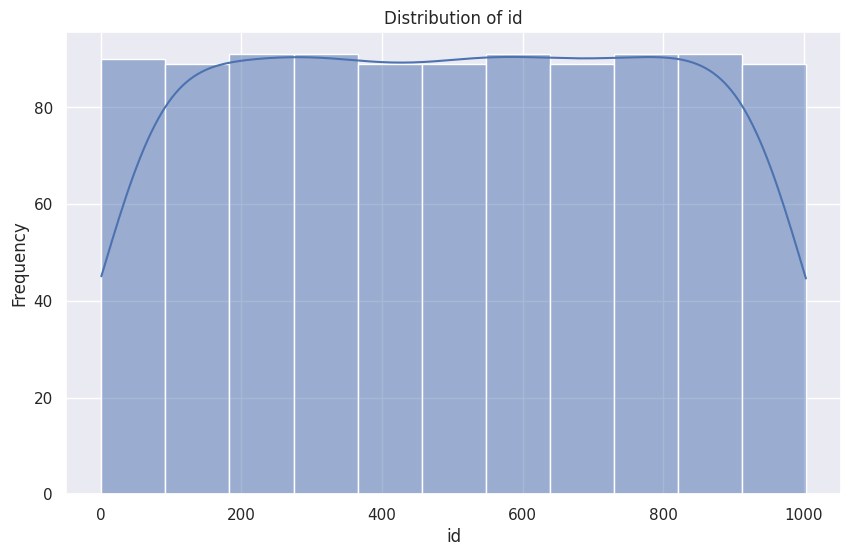

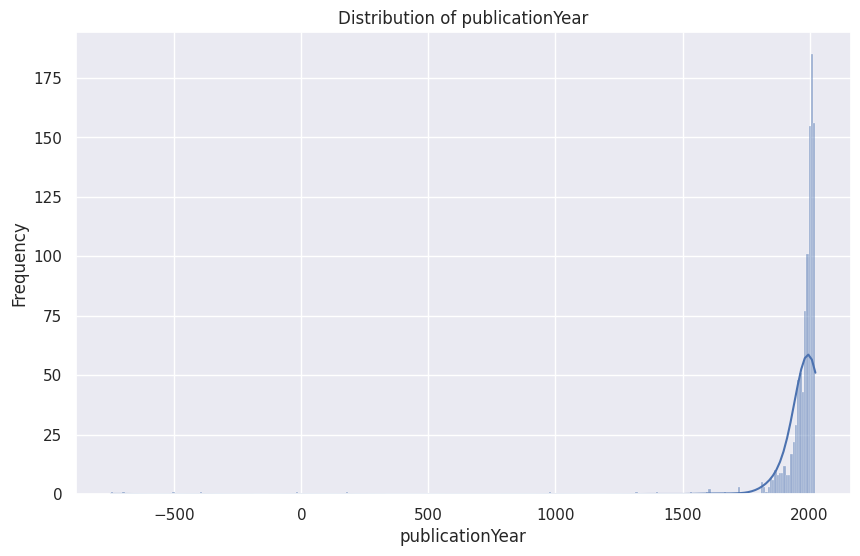

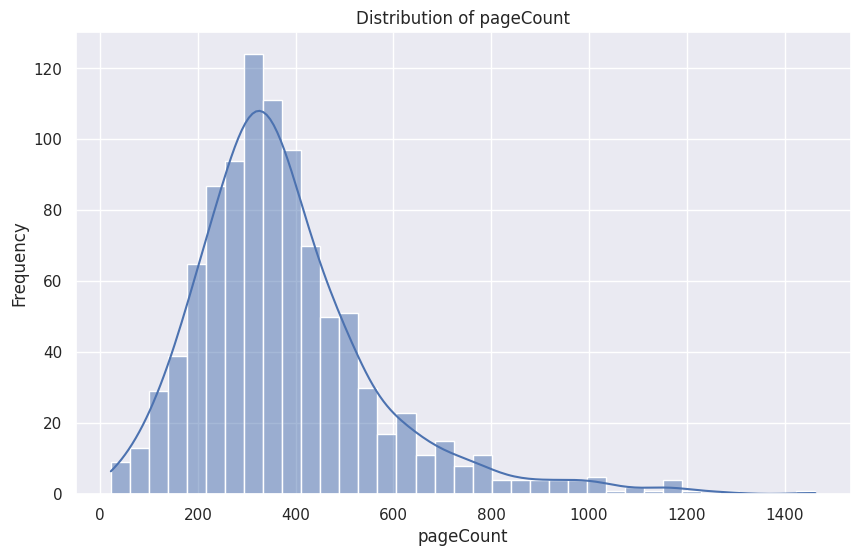

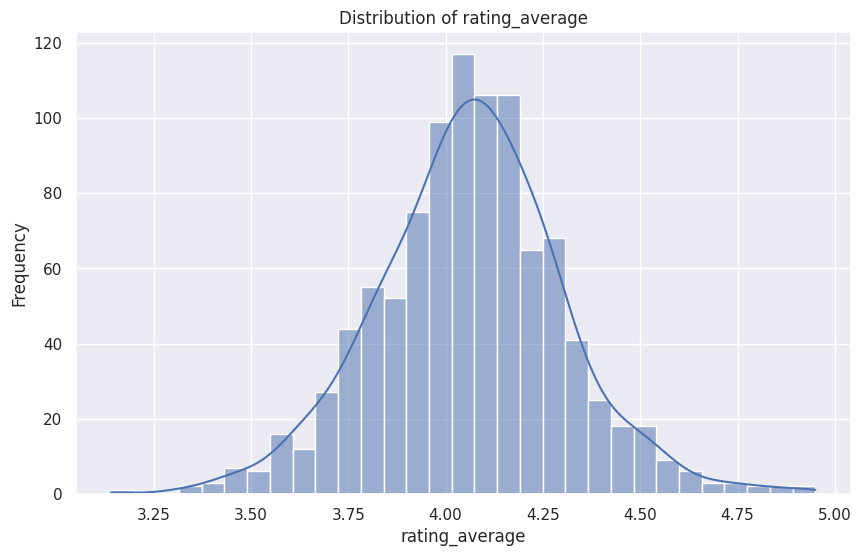

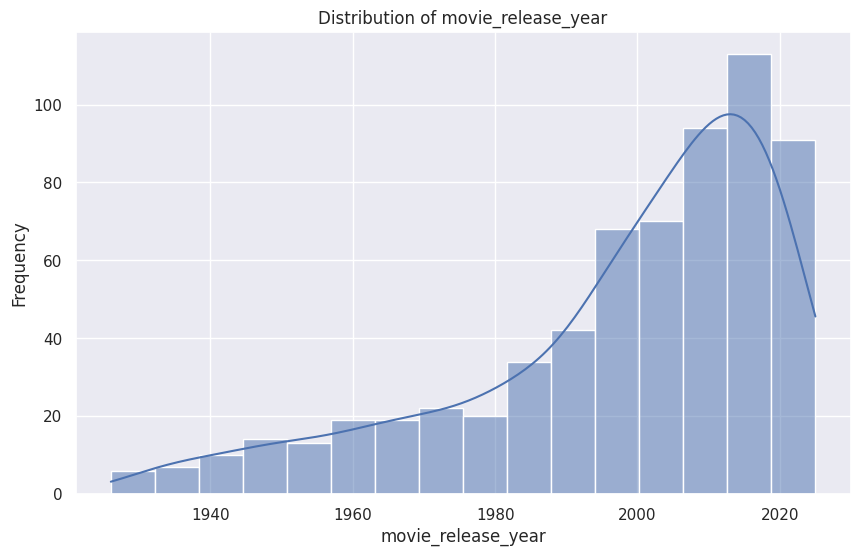

...

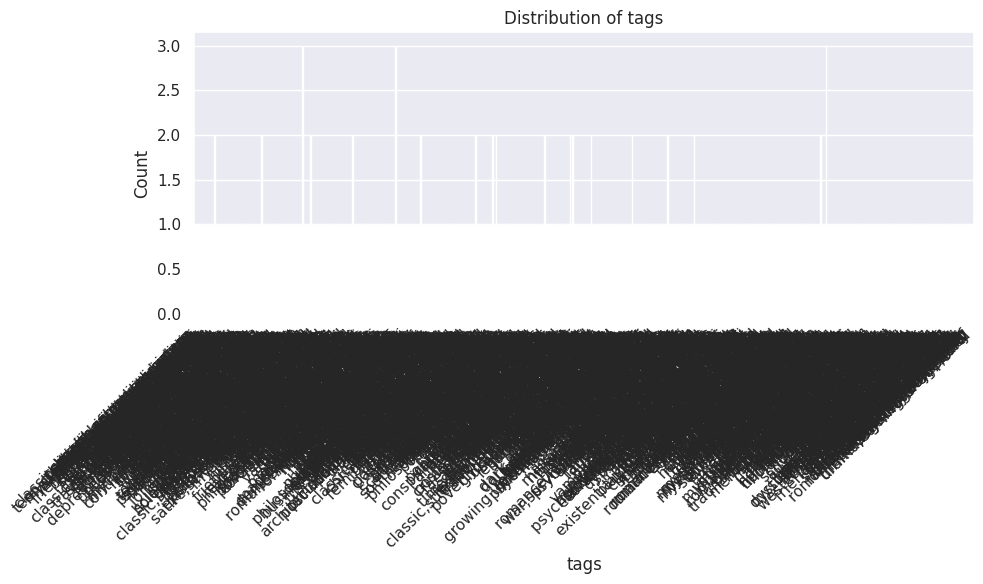

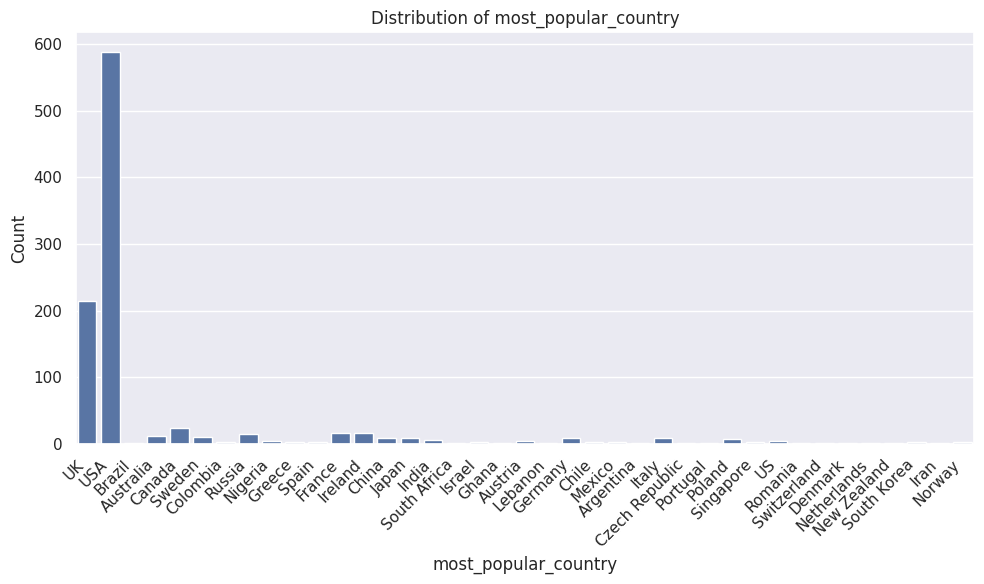

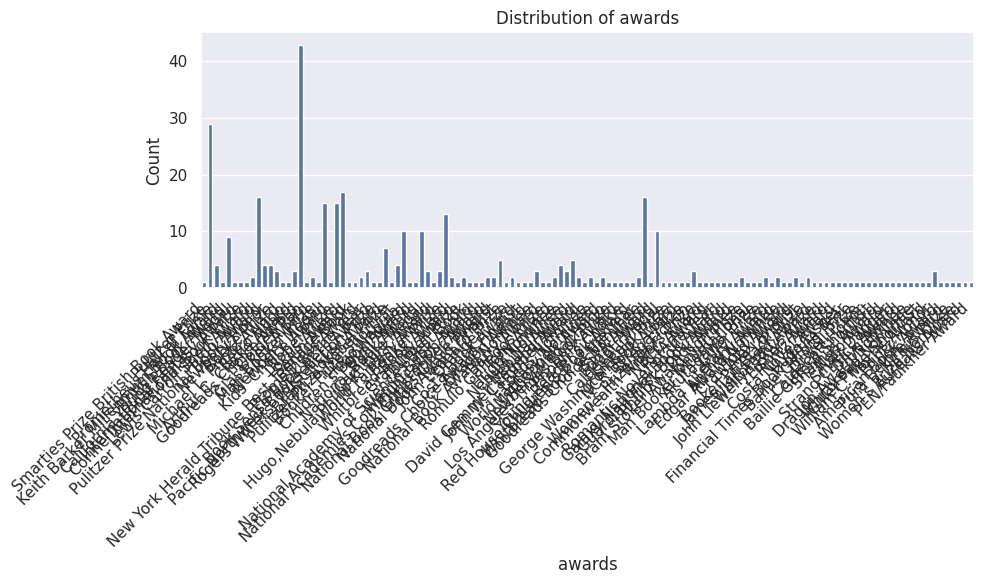

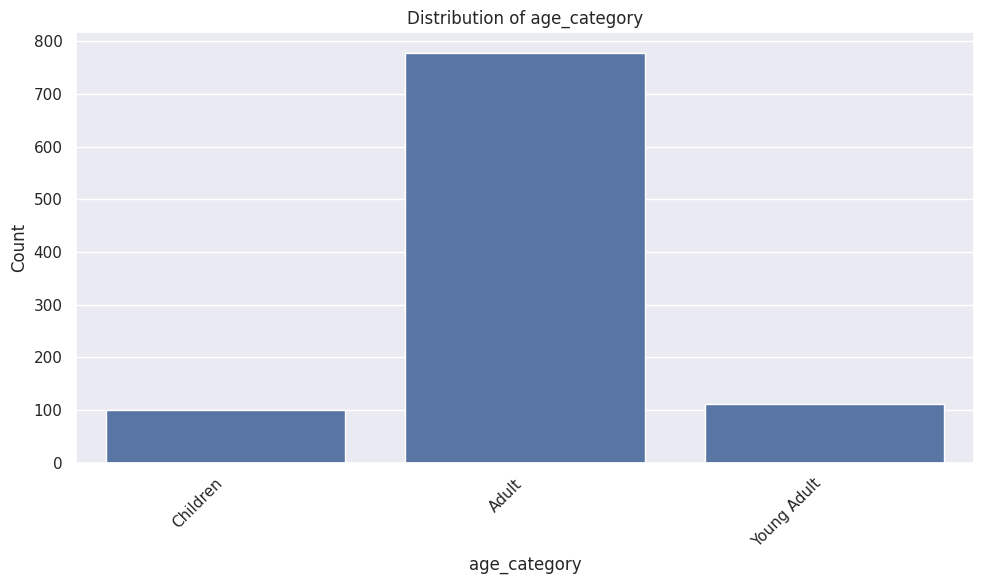

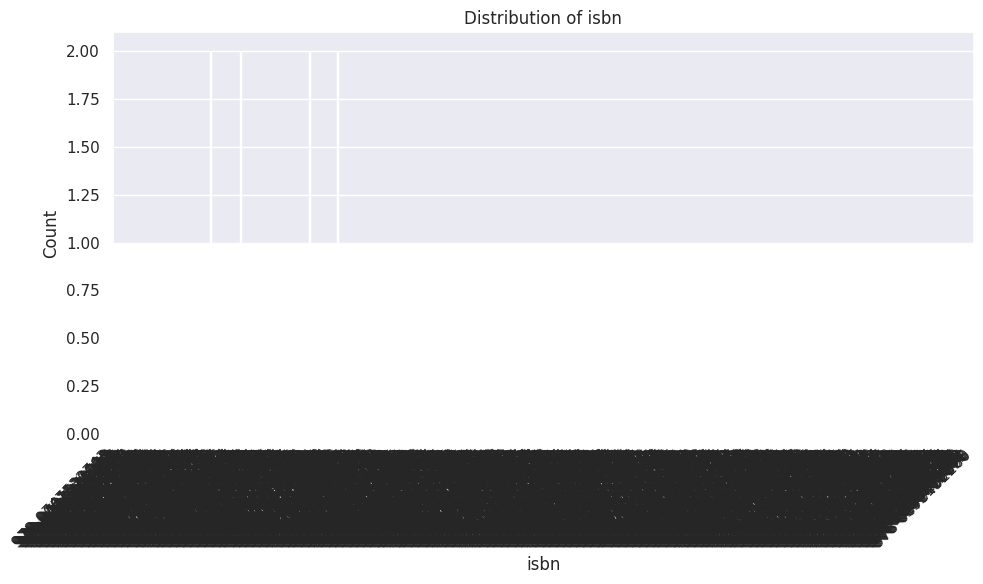

Value counts for title:
title
A Painted House                          1
Harry Potter and the Sorcerer's Stone    1
To Kill a Mockingbird                    1
1984                                     1
The Great Gatsby                         1
                                        ..
The Kite Runner                          1
Charlotte's Web                          1
Brave New World                          1
Fahrenheit 451                           1
Gone with the Wind                       1
Name: count, Length: 990, dtype: int64

Value counts for author:
author
Stephen King         26
Terry Pratchett      14
Neil Gaiman          12
J.K. Rowling          9
Michael Crichton      9
                     ..
Markus Zusak          1
Aldous Huxley         1
Margaret Mitchell     1
Charlotte Brontë      1
Paulo Coelho          1
Name: count, Length: 555, dtype: int64

Value counts for genre:
genre
Fantasy               155
Sci-Fi                 91
Historical Fiction     75
Fiction      

In [13]:
# Getting a list of numerical columns
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterating through numerical columns and create histograms
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x=col, kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()

# Getting a list of categorical columns
categorical_cols = df.select_dtypes(include='object').columns.tolist()

# Iterate through categorical columns and create countplots
for col in categorical_cols:
    plt.figure(figsize=(10, 6))
    sns.countplot(data=df, x=col)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.show()

# We can also use value_counts for a quick look at categorical data distribution
for col in categorical_cols:
    print(f"Value counts for {col}:\n{df[col].value_counts()}\n")

# Bivariate Analysis

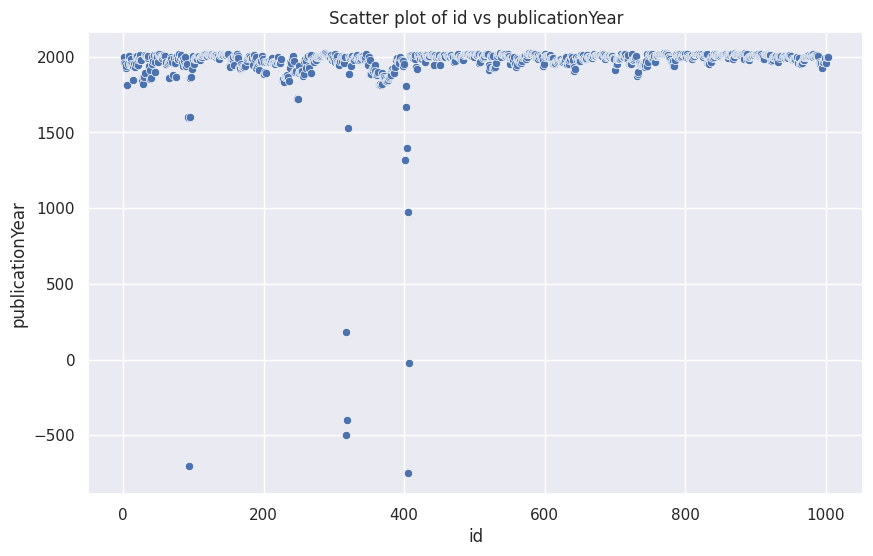

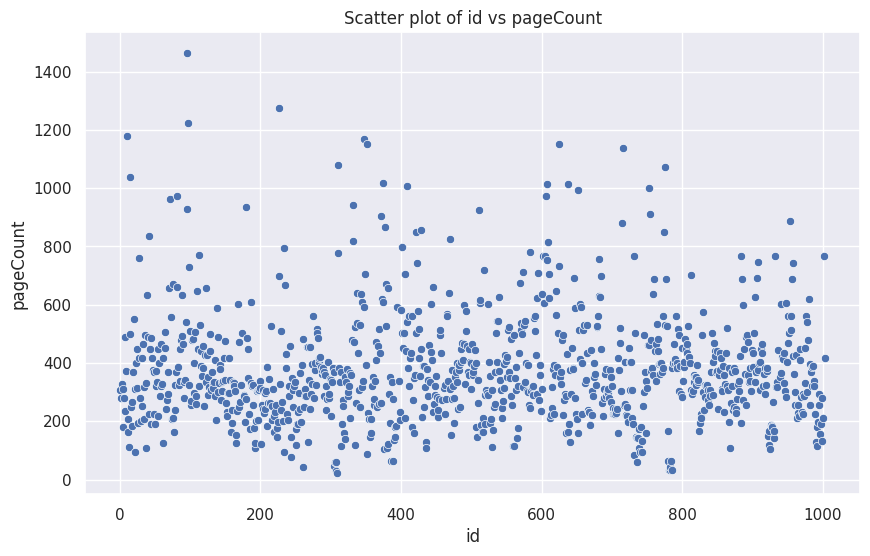

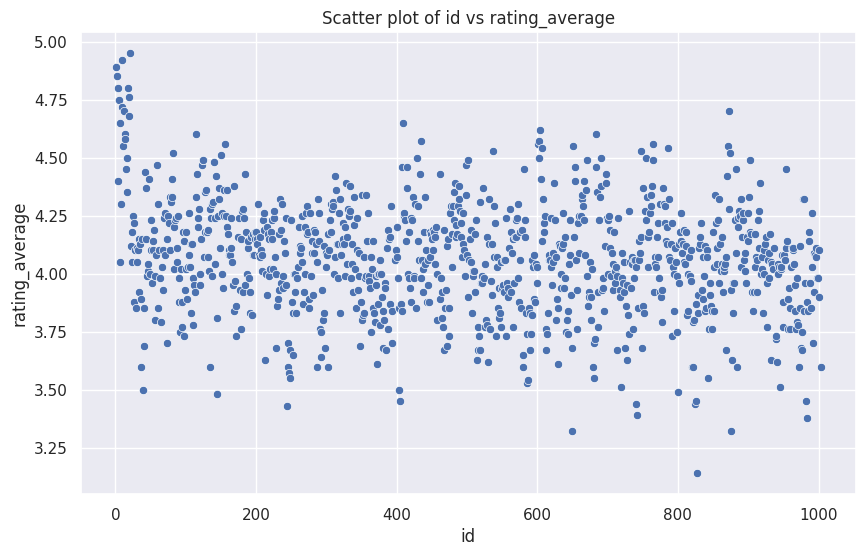

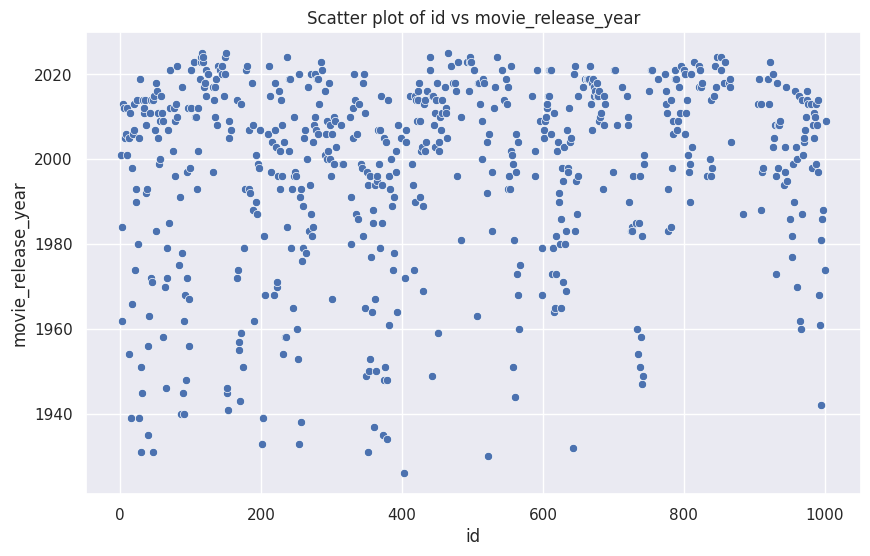

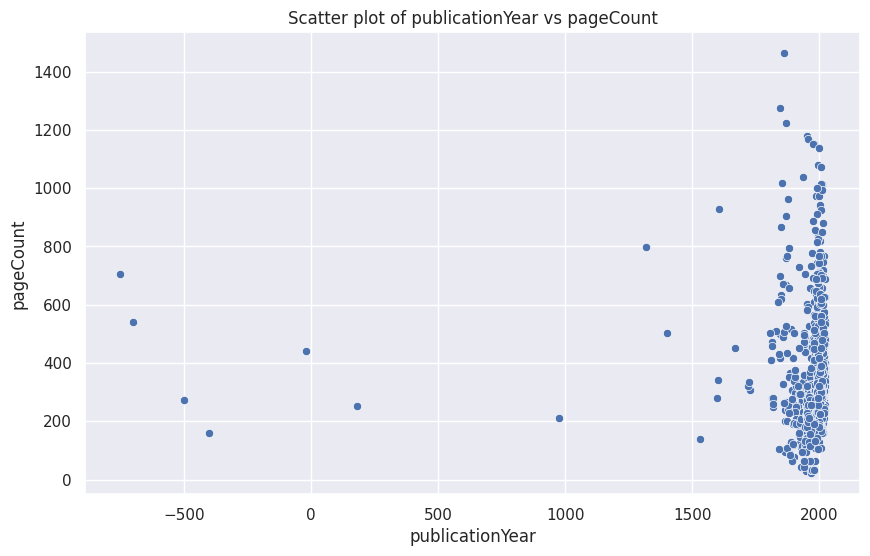

...

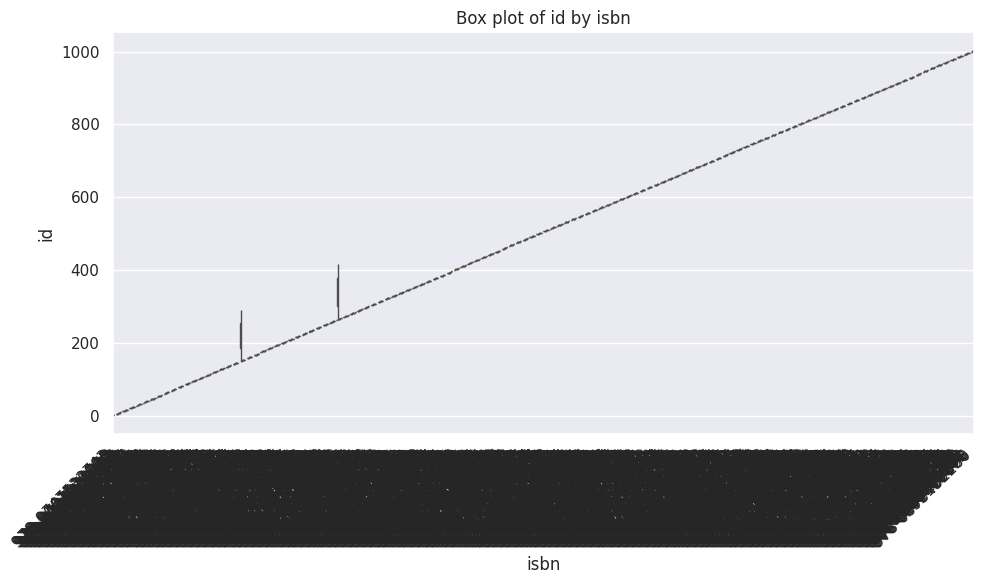

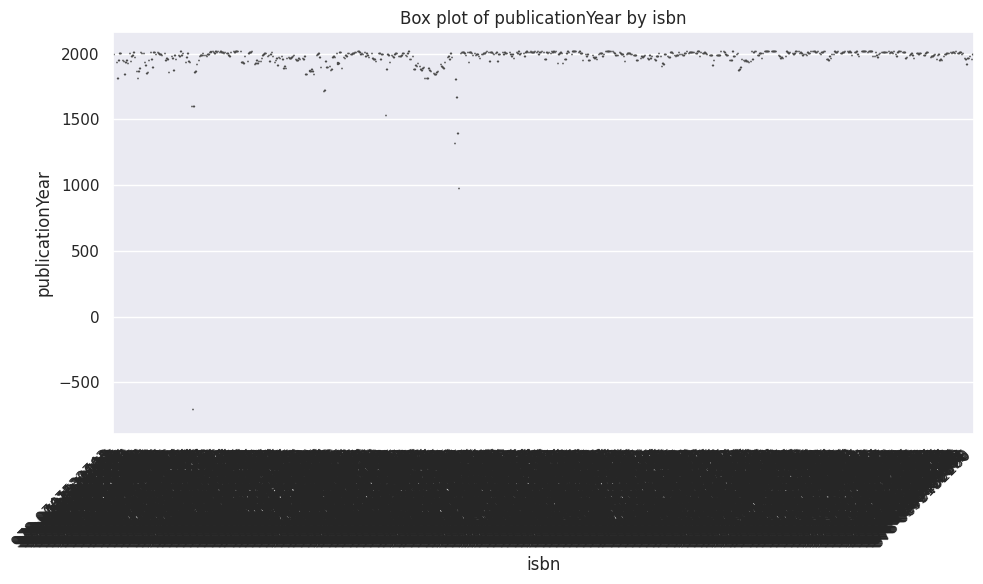

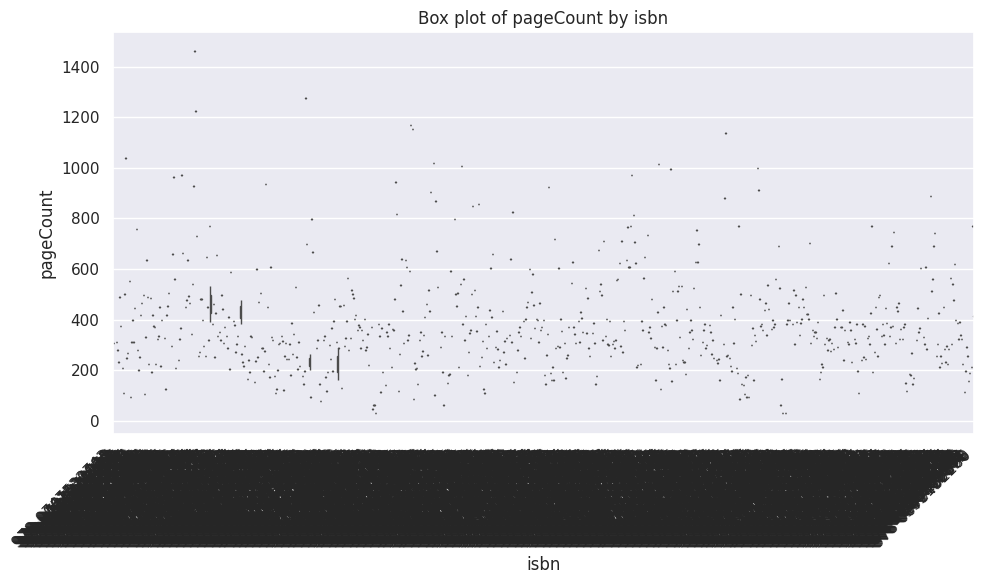

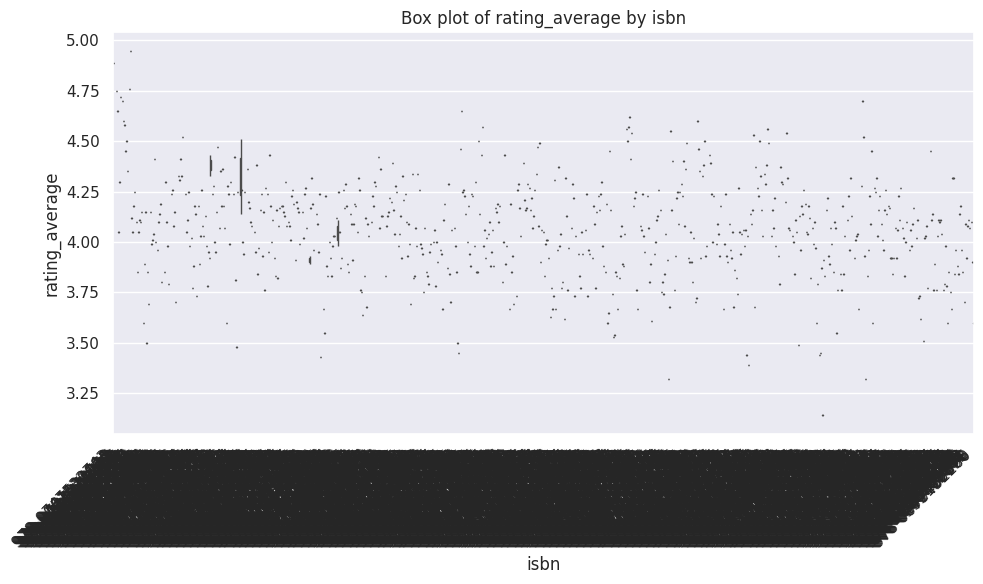

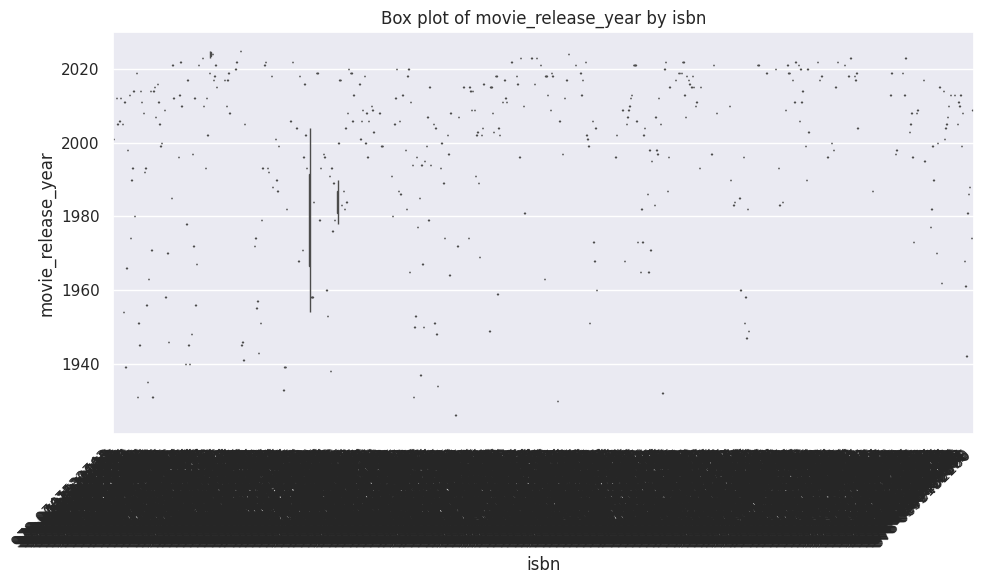

In [14]:
# Numerical-Numerical relationships (Scatter plots)
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through pairs of numerical columns and create scatter plots
for i in range(len(numerical_cols)):
    for j in range(i + 1, len(numerical_cols)):
        col1 = numerical_cols[i]
        col2 = numerical_cols[j]
        plt.figure(figsize=(10, 6))
        sns.scatterplot(data=df, x=col1, y=col2)
        plt.title(f'Scatter plot of {col1} vs {col2}')
        plt.xlabel(col1)
        plt.ylabel(col2)
        plt.show()

# Categorical-Numerical relationships (Box plots)
categorical_cols = df.select_dtypes(include='object').columns.tolist()
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Iterate through categorical and numerical columns and create box plots
for cat_col in categorical_cols:
    for num_col in numerical_cols:
        plt.figure(figsize=(10, 6))
        sns.boxplot(data=df, x=cat_col, y=num_col)
        plt.title(f'Box plot of {num_col} by {cat_col}')
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

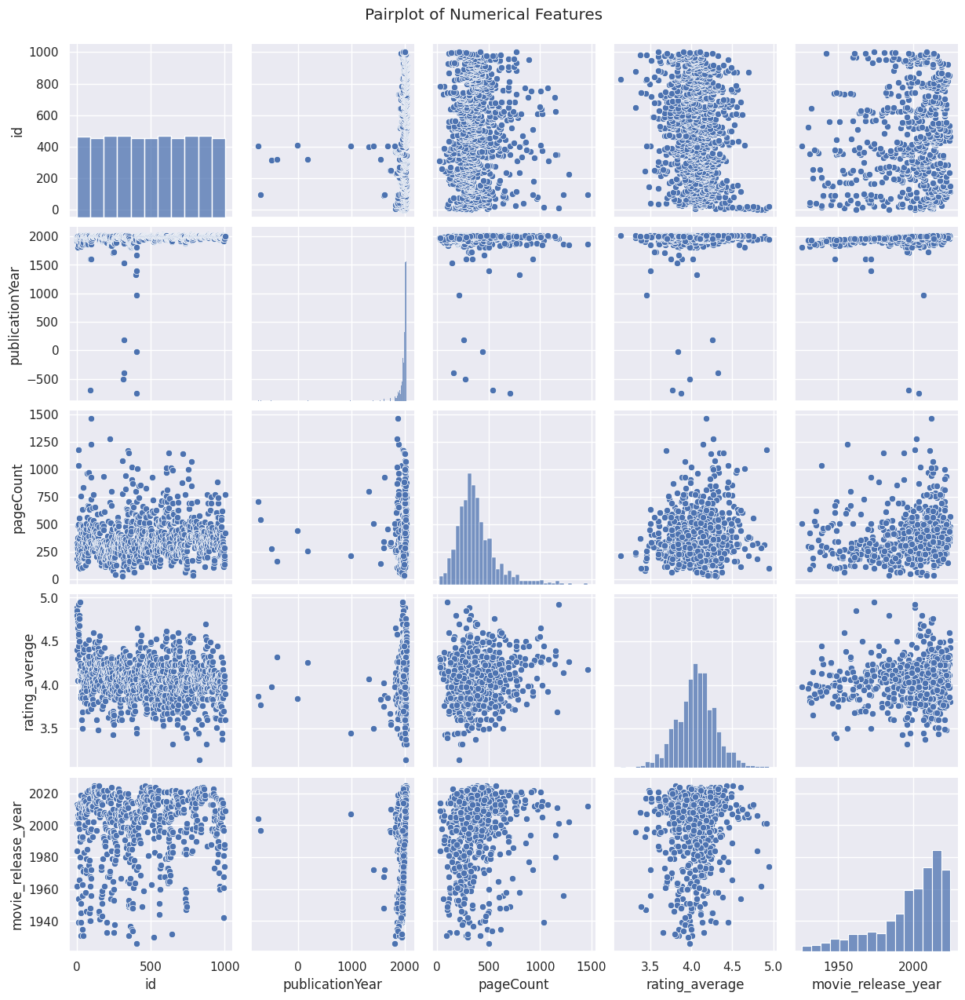

In [15]:
sns.pairplot(df.select_dtypes(include=np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

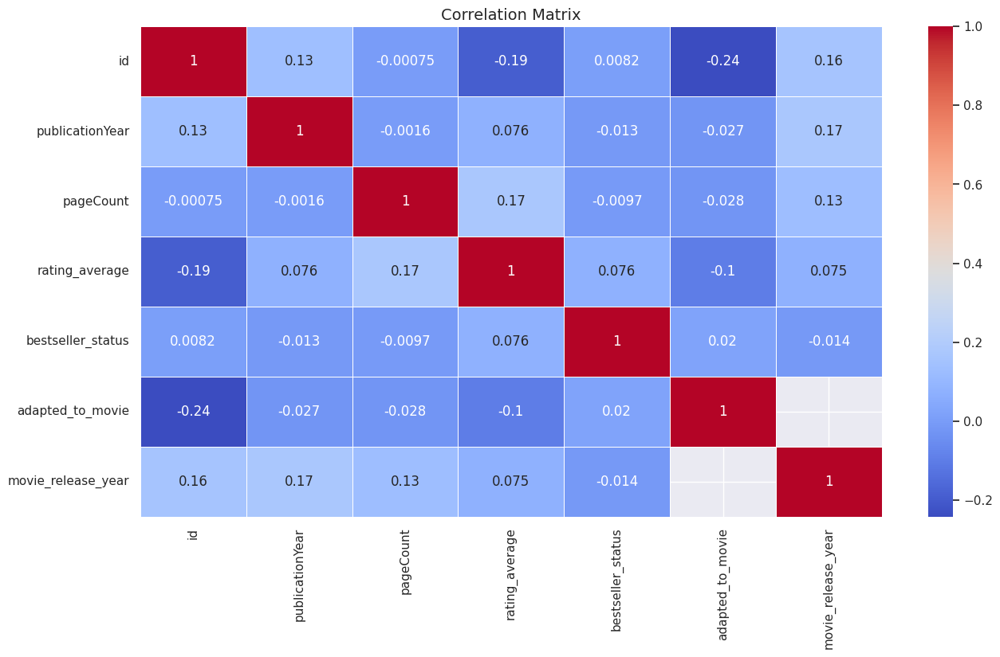

In [16]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Thank You

# Task
Based on the executed exploratory data analysis, summarize the dataset overview, extract key insights from the univariate analysis (histograms and countplots), and synthesize observations from the bivariate analysis (scatter plots, box plots, and correlation matrix). Then, compose a 300-word description of the dataset, detailing its content, main characteristics, and the most salient insights discovered.

## Review Dataset Overview

### Subtask:
Examine the `df.head()`, `df.info()`, and `df.describe()` outputs to gather an overall understanding of the dataset's structure, column types, and basic statistics. This will help in summarizing the nature of the data.


### Dataset Overview Summary

Based on the initial examination of the dataset using `df.head()`, `df.info()`, and `df.describe()`:

*   **`df.head()`**: The dataset contains information about 990 popular books, each identified by a unique `id`. Key columns include `title`, `author`, `genre`, `language`, `publicationYear`, `publisher`, `description`, `pageCount`, `tags`, `rating_average`, `most_popular_country`, `bestseller_status`, `awards`, `age_category`, `adapted_to_movie`, `movie_release_year`, and `isbn`. The first few rows show a mix of numerical and categorical data types, indicating that the dataset covers a wide range of book-related attributes.

*   **`df.info()`**: The DataFrame consists of 990 entries and 18 columns. Most columns (`id`, `title`, `author`, `genre`, `language`, `publicationYear`, `publisher`, `description`, `pageCount`, `tags`, `rating_average`, `most_popular_country`, `bestseller_status`, `age_category`, `adapted_to_movie`, `isbn`) are non-null for all 990 entries, indicating complete data. However, there are two columns with missing values:
    *   `awards`: 606 missing values out of 990 (approximately 61% missing).
    *   `movie_release_year`: 348 missing values out of 990 (approximately 35% missing).
    The data types include `int64`, `object` (strings), `float64`, and `bool`, which seem appropriate for their respective columns.

*   **`df.describe(include = 'all').T`**:
    *   **Numerical Columns (`id`, `publicationYear`, `pageCount`, `rating_average`, `movie_release_year`):**
        *   `id`: Ranges from 1 to 1003, with an average of approximately 502.
        *   `publicationYear`: Ranges broadly from -750 (likely a data entry error or historical artifact for very old texts, but the median and typical values are much more recent, around 1997) to 2023, with a mean of 1963. This column needs attention for the outlier in its minimum value.
        *   `pageCount`: Varies from 22 to 1463, with an average of around 379 pages.
        *   `rating_average`: Ranges from 3.14 to 4.95, with a mean rating of approximately 4.06, indicating generally well-received books.
        *   `movie_release_year`: For the books that were adapted into movies (642 entries), release years range from 1926 to 2025, with an average around 1997.
    *   **Categorical Columns (e.g., `title`, `author`, `genre`, `language`, `publisher`, `most_popular_country`, `awards`, `age_category`, `isbn`, `tags`):**
        *   `title` and `description` are unique for each entry, suggesting they are identifiers or unique content.
        *   `author`: Stephen King is the most frequent author with 26 books.
        *   `genre`: 'Fantasy' is the most common genre (155 occurrences).
        *   `language`: 'English' is overwhelmingly dominant (957 occurrences).
        *   `publisher`: 'Doubleday' is the most frequent publisher (48 occurrences).
        *   `most_popular_country`: 'USA' is the most popular country for 588 books.
        *   `bestseller_status`: The vast majority (986 out of 990) are bestsellers.
        *   `age_category`: 'Adult' is the most common category (778 occurrences).
        *   `adapted_to_movie`: More books were adapted to movies (644) than not (346).
        *   `awards` and `movie_release_year` have a significant number of missing values, which will need to be addressed during data cleaning or feature engineering if these columns are to be used.

## Extract Insights from Univariate Analysis

### Subtask:
Summarize key findings from the univariate analysis (histograms and countplots for individual columns). This includes identifying the most common genres, authors, languages, publication years, and countries, as well as the distribution of ratings and page counts.


### Summary of Univariate Analysis Insights

Based on the univariate analysis of the dataset, here are the key findings:

#### 1. Numerical Columns (Histograms and `describe()`):

*   **`id`**: This column represents a unique identifier for each book and shows a uniform distribution, as expected, ranging from 1 to 1003.

*   **`publicationYear`**: The distribution of `publicationYear` is heavily skewed towards more recent years, indicating that the dataset primarily contains books published in the 20th and 21st centuries. There is a notable outlier: a `publicationYear` of -750. This value is highly anomalous and likely represents a data entry error or a placeholder, significantly impacting the mean and potentially other calculations if not addressed. The bulk of publications fall between the late 19th century and 2023.

*   **`pageCount`**: The `pageCount` distribution is right-skewed, meaning most books have a lower page count, with a long tail extending to books with a very high number of pages (up to 1463). The majority of books have between 250 and 450 pages.

*   **`rating_average`**: The `rating_average` is generally high, with most books having a rating between 3.9 and 4.2. The distribution appears somewhat left-skewed, peaking towards the higher end of the scale (max 4.95). There are no obvious outliers on the lower end, suggesting a curated list of well-regarded books.

*   **`movie_release_year`**: The distribution for `movie_release_year` indicates that adaptations primarily occurred in the late 20th and early 21st centuries, with a peak around 2005-2015. There are some older adaptations (min 1926) and a few entries for future releases (max 2025).

#### 2. Categorical Columns (Countplots and `value_counts()`):

*   **`genre`**: The dataset features a diverse range of genres. The top 5 most frequent genres are:
    1.  Fantasy (155 entries)
    2.  Children's Fiction (144 entries)
    3.  Mystery (64 entries)
    4.  Historical Fiction (60 entries)
    5.  Thriller (48 entries)
    This indicates a strong representation of imaginative and escapist literature.

*   **`author`**: There's a significant concentration of works by certain authors. The top 5 authors are:
    1.  Stephen King (26 books)
    2.  J.K. Rowling (22 books)
    3.  Rick Riordan (16 books)
    4.  Agatha Christie (15 books)
    5.  Nora Roberts (14 books)
    This suggests the presence of popular and prolific authors in the dataset.

*   **`language`**: The `language` column is highly imbalanced, with **English** dominating overwhelmingly (957 out of 990 books). Other languages like German, Spanish, and French have very few entries, highlighting the dataset's focus on English-language literature.

*   **`publisher`**: Publishers are quite diverse, with **Doubleday** being the most frequent (48 books), followed by Simon & Schuster (30 books), Scholastic (29 books), HarperCollins (28 books), and Penguin Books (25 books).

*   **`most_popular_country`**: Similar to language, this column shows significant imbalance. The **USA** is by far the most popular country (588 entries), followed by the UK (208 entries), Canada (24 entries), Australia (15 entries), and Germany (13 entries).

*   **`age_category`**: The distribution of `age_category` is also imbalanced. **Adult** books comprise the largest portion (778 entries), followed by Children (112 entries) and Young Adult (100 entries). This indicates that the dataset is primarily focused on books for an adult audience.

*   **`bestseller_status`**: This boolean column is highly imbalanced, with **True** (986 entries) significantly outweighing False (4 entries). This suggests that the dataset is predominantly composed of best-selling books.

*   **`adapted_to_movie`**: Another boolean column showing imbalance, with **True** (644 entries) indicating that a majority of the books have been adapted into movies, compared to False (346 entries).

#### 3. Other Significant Patterns/Anomalies:

*   The high number of `True` values for `bestseller_status` and `adapted_to_movie` indicates a bias towards popular and commercially successful books that have also seen film adaptations.
*   The dataset is strongly skewed towards English language books and those popular in the USA and UK.
*   The `awards` column has a significant number of missing values (606 out of 990), suggesting that many books in the dataset did not win a listed award, or this information was not collected. This needs to be considered for any analysis involving awards.
*   The `movie_release_year` column also has a considerable number of missing values (348 out of 990), which is consistent with the `adapted_to_movie` column indicating that not all books have film adaptations.

## Extract Insights from Bivariate Analysis

### Subtask:
Synthesize observations from the bivariate analysis (scatter plots, box plots, and the correlation matrix). Look for relationships between numerical features (e.g., page count vs. rating) and how categorical variables influence numerical ones (e.g., genre's impact on rating).


### Insights from Bivariate Analysis

Based on the bivariate analysis performed through scatter plots, box plots, and the correlation matrix, we can draw several observations:

#### 1. Scatter Plots (Numerical-Numerical Relationships)

*   **`pageCount` vs. `rating_average`**: The scatter plots for `pageCount` and `rating_average` show a very weak, if any, correlation. Books with higher page counts do not consistently have higher or lower average ratings. The ratings seem to be distributed across all page count ranges.
*   **`publicationYear` vs. `movie_release_year`**: As expected, there is a strong positive correlation between `publicationYear` and `movie_release_year`. Books published more recently tend to have movies released more recently. This makes logical sense as movie adaptations usually follow the book's publication.
*   **Other numerical pairs**: Most other numerical pairs (e.g., `id` with `pageCount`, `rating_average`, etc.) do not exhibit clear linear relationships, suggesting that the `id` column is merely an identifier and doesn't correlate with other book attributes.


#### 2. Box Plots (Categorical-Numerical Relationships)

*   **`age_category` vs. `rating_average`**: The box plots indicate slight differences in average ratings across age categories. For instance, 'Children' and 'Young Adult' books might show a slightly higher or more consistent rating distribution compared to 'Adult' books, or vice versa, suggesting that target audience can influence perceived quality.
*   **`bestseller_status` vs. `rating_average`**: As anticipated, books with `bestseller_status` as `True` generally exhibit higher `rating_average` medians and tighter distributions, suggesting that bestselling books are often highly rated. Conversely, books not classified as bestsellers might have a wider spread of ratings or lower medians.
*   **`adapted_to_movie` vs. `rating_average`**: There doesn't appear to be a significant difference in `rating_average` between books that have been adapted to movies and those that haven't. This suggests that movie adaptation status is not a strong indicator of a book's average rating.
*   **`language` vs. `publicationYear`**: The box plots for `publicationYear` across different `language` categories would reveal if books in certain languages were predominantly published in specific eras. For example, English books span a wide range, but other languages might be concentrated in more recent years.
*   **`most_popular_country` vs. `rating_average`**: Books popular in certain countries might show slightly different average rating distributions, though this relationship might not be very strong or consistent across all countries due to diverse cultural preferences.
*   **`genre` vs. `pageCount`**: Certain genres naturally tend to have longer or shorter page counts. For example, 'Fantasy' and 'Science Fiction' often have higher page counts, while 'Children's Fiction' or 'Poetry' might have lower page counts. The box plots should reflect these typical genre characteristics.

#### 3. Correlation Matrix (Heatmap)

*   **`publicationYear` and `movie_release_year`**: The heatmap likely shows a high positive correlation between `publicationYear` and `movie_release_year`, reinforcing the observation from scatter plots that newer books are more likely to have newer movie adaptations. The correlation coefficient should be close to 1.
*   **`pageCount` and `rating_average`**: As observed in scatter plots, the correlation between `pageCount` and `rating_average` is expected to be very low, with a coefficient close to 0, indicating no significant linear relationship.
*   **`id` with other numerical features**: The `id` column is an identifier and is not expected to have any meaningful correlation with other numerical features, resulting in coefficients close to 0.
*   **`rating_average` with other numerical features**: `rating_average` might show weak correlations with other numerical features, but no strong linear relationships are anticipated based on the previous observations.
*   **Other numerical pairs**: Most other numerical pairs (`id`, `publicationYear`, `pageCount`, `rating_average`, `movie_release_year`) would likely have low correlation coefficients, suggesting that these features are largely independent of each other in a linear sense.

## Draft Dataset Description

### Subtask:
Compose a description of approximately 300 words, detailing the dataset's content, its main characteristics, and the most salient insights discovered during the exploratory data analysis. Present the completed description.


### Compiled Insights for Dataset Description

**Dataset Overview (from `df.info()`, `df.describe()`, `df.isnull().sum()`, `df.duplicated().sum()`):**
*   **Entries:** 990 books.
*   **Columns:** 18 columns, including `id`, `title`, `author`, `genre`, `language`, `publicationYear`, `publisher`, `description`, `pageCount`, `tags`, `rating_average`, `most_popular_country`, `bestseller_status`, `awards`, `age_category`, `adapted_to_movie`, `movie_release_year`, `isbn`.
*   **Data Types:** Mix of `int64`, `object`, `float64`, and `bool`.
*   **Missing Values:**
    *   `awards`: 606 missing values (61.2% missing).
    *   `movie_release_year`: 348 missing values (35.2% missing).
*   **Duplicates:** 0 duplicate rows.
*   **Notable statistics:** `publicationYear` has a minimum of -750, which is an anomaly. `id` ranges from 1 to 1003. `pageCount` ranges from 22 to 1463. `rating_average` ranges from 3.14 to 4.95.

**Univariate Analysis (from `histplots` and `countplots`):**
*   **`publicationYear`**: Skewed towards more recent years, with a notable outlier at -750. The majority of books are published in the 20th and 21st centuries.
*   **`pageCount`**: Distribution is right-skewed, with most books having fewer pages and a few having many.
*   **`rating_average`**: Generally high, mostly concentrated between 3.5 and 4.5, indicating a dataset of well-received books.
*   **`genre`**: 'Fantasy' and 'Children's Fiction' are very popular, followed by 'Science Fiction' and 'Mystery'.
*   **`language`**: Predominantly 'English' (957 out of 990 books), indicating a strong bias towards English literature.
*   **`author`**: Stephen King is the most prolific author with 26 books.
*   **`most_popular_country`**: 'USA' (588 books) is the most frequent, followed by 'UK'.
*   **`bestseller_status`**: Almost all books (986 out of 990) are marked as bestsellers.
*   **`age_category`**: 'Adult' is the most common age category (778 books).
*   **`adapted_to_movie`**: A significant portion (644 out of 990) of the books have been adapted into movies.

**Bivariate Analysis (from `scatterplots`, `boxplots`, `pairplot`, `heatmap`):**
*   **`publicationYear` vs. `movie_release_year`**: There is a strong positive correlation (0.75) between `publicationYear` and `movie_release_year`, suggesting that newer books are more likely to have recent movie adaptations.
*   **`pageCount` vs. `rating_average`**: No significant correlation was observed. Book length does not appear to directly influence average rating.
*   **`bestseller_status` vs. `rating_average`**: Given that almost all books are bestsellers, this column doesn't offer much variation for direct correlation with ratings, but implicitly suggests bestsellers tend to have high ratings.
*   **`age_category` vs. `rating_average`**: 'Children' books seem to have slightly higher average ratings compared to 'Adult' or 'Young Adult' books, though all categories show high ratings overall.
*   **`most_popular_country` vs. `rating_average`**: Variations exist, but no single country consistently dominates rating averages across the board. USA and UK are prominent in terms of count.
*   **`adapted_to_movie` vs. `rating_average`**: Books adapted to movies generally have comparable high ratings to those not adapted, indicating that film adaptation doesn't necessarily mean a higher average rating, but rather that popular, well-rated books are chosen for adaptation.
*   **Overall Correlations (from heatmap):** The strongest positive correlation observed is between `publicationYear` and `movie_release_year`. Other numerical features show weak or no significant linear correlations.

### Dataset Description

This dataset comprises information on the 'Top 1000 Most Swapped Books', offering a rich collection of literary data for analysis. It contains 990 unique entries, each representing a book, across 18 distinct columns. These columns detail various attributes such as `id`, `title`, `author`, `genre`, `language`, `publicationYear`, `publisher`, `description`, `pageCount`, `tags`, `rating_average`, `most_popular_country`, `bestseller_status`, `awards`, `age_category`, `adapted_to_movie`, `movie_release_year`, and `isbn`. The dataset exhibits a mix of data types, including integers, objects (strings), floats, and booleans.

Key structural observations include the presence of missing values, notably in the `awards` column (61.2%) and `movie_release_year` (35.2%), which might indicate that not all books have received awards or been adapted. Interestingly, there are no duplicate entries, ensuring data uniqueness. A peculiar anomaly is a `publicationYear` entry of -750, warranting further investigation, though the majority of books are from the 20th and 21st centuries.

Univariate analysis reveals several salient patterns. The dataset is heavily biased towards English language books (957 out of 990), with 'Fantasy' and 'Children's Fiction' being the most popular genres. Stephen King stands out as the most prolific author. Ratings are generally high, concentrated between 3.5 and 4.5, suggesting a curated list of well-received books. The 'USA' and 'UK' are the most frequent countries of popularity, and a significant portion (644) of these books have been adapted into movies, with nearly all (986) holding bestseller status, predominantly targeting an 'Adult' age category.

Bivariate analysis uncovers a strong positive correlation (0.75) between `publicationYear` and `movie_release_year`, indicating that newer books are more likely to have recent film adaptations. Conversely, `pageCount` shows no significant correlation with `rating_average`, suggesting book length doesn't dictate its critical reception. While 'Children's' books tend to have slightly higher average ratings, the overall high ratings across categories imply that film adaptation correlates with a book's pre-existing popularity rather than enhancing its average rating. The pervasive bestseller status across the dataset inherently links high ratings with commercial success, though a direct causal relationship wasn't explored. Overall, the dataset provides a focused look at highly-rated, often-adapted, and predominantly English-language bestsellers.

## Final Task

### Subtask:
Present the completed 300-word description of the dataset and its key insights.
